In [1]:
%load_ext aiida
%aiida

Loaded AiiDA DB environment - profile name: bit.

In [2]:
from ase.io import read
from aiida import orm
from monty.serialization import loadfn, dumpfn
import numpy as np
from aiida_vasp.workchains import VaspHybridBandsWorkChain
from aiida_vasp.workchains.v2 import VaspHybridBandUpdater, VaspRelaxUpdater
from aiida_grouppathx import GroupPathX
from tqdm import tqdm

In [3]:
basepath = GroupPathX('hc-antiperovskites-mbj')
structpath = basepath['structures']

Deposit the structures

Sort the nodes based on their number of sites

In [4]:
structpath.show_tree()

structures
├── Ba3GeO_cubic *
├── Ba3GeS_cubic *
├── Ba3GeSe_cubic *
├── Ba3GeTe_cubic *
├── Ba3PbO_cubic *
├── Ba3PbS_cubic *
├── Ba3PbSe_cubic *
├── Ba3PbTe_cubic *
├── Ba3SbO_cubic *
├── Ba3SbS_cubic *
├── Ba3SbSe_cubic *
├── Ba3SbTe_cubic *
├── Ba3SiO_cubic *
├── Ba3SiS_cubic *
├── Ba3SiSe_cubic *
├── Ba3SiTe_cubic *
├── Ba3SnO_cubic *
├── Ba3SnS_cubic *
├── Ba3SnSe_cubic *
├── Ba3SnTe_cubic *
├── Ca3GeO_cubic *
├── Ca3GeS_cubic *
├── Ca3GeSe_cubic *
├── Ca3GeTe_cubic *
├── Ca3PbO_cubic *
├── Ca3PbS_cubic *
├── Ca3PbSe_cubic *
├── Ca3PbTe_cubic *
├── Ca3SbO_cubic *
├── Ca3SbS_cubic *
├── Ca3SbSe_cubic *
├── Ca3SbTe_cubic *
├── Ca3SiO_cubic *
├── Ca3SiS_cubic *
├── Ca3SiSe_cubic *
├── Ca3SiTe_cubic *
├── Ca3SnO_cubic *
├── Ca3SnS_cubic *
├── Ca3SnSe_cubic *
├── Ca3SnTe_cubic *
├── Mg3GeO_cubic *
├── Mg3GeS_cubic *
├── Mg3GeSe_cubic *
├── Mg3GeTe_cubic *
├── Mg3PbO_cubic *
├── Mg3PbS_cubic *
├── Mg3PbSe_cubic *
├── Mg3PbTe_cubic *
├── Mg3SbO_cubic *
├── Mg3SbS_cubic *
├── Mg3SbSe_cub

## Setting up the calculation

In [5]:
def get_upd(node):
    """Generate process builder"""
    upd = VaspHybridBandUpdater().apply_preset(structure=node, overrides={
        'metagga': 'mbj',
        'ispin': 1,
        'gga': None,
        'magmom': None,
        'ncore': 4,
        'kpar': 2,
        'sigma': 0.005
    },
         code='vasp-6.3.0@sugon-xian-v2', label=f'{node.get_formula()} {node.label} MBJ')
    upd.set_resources(num_machines=1, tot_num_mpiprocs=8)
    upd.set_options(max_wallclock_seconds=3600 * 48, queue_name='xahcnormal')
    # Only re-try twice if there is convergence problem
    upd.builder.scf.max_iterations = 2
    upd.set_kspacing(0.03)
    upd_relax = VaspRelaxUpdater(builder=upd.builder.relax)
    upd_relax.apply_preset(structure=node, overrides={
        #'metagga': 'mbj',
        'ispin': 1,
        'gga': None,
        'magmom': None,
        'ncore': 4,
        'kpar': 2
    },
         code='vasp-6.3.0-autotruncate@sugon-xian-v2', label=f'{node.get_formula()} {node.label} RELAX')
    upd_relax.set_resources(num_machines=1, tot_num_mpiprocs=8)
    upd_relax.set_options(max_wallclock_seconds=3600 * 12, queue_name='xahcnormal')
    upd_relax.set_relax_settings(keep_sp_workdir=True)
    upd_relax.set_kspacing(0.03)
    upd_relax.builder.vasp.clean_workdir = False # We must 
    upd.set_band_settings(band_mode='bradcrack', line_density=20, kpoints_per_split=200, hybrid_reuse_wavecar=True)
    return upd

In [6]:
def get_upd_hse06(node):
    """Generate process builder"""
    hse_additions = {'lhfcalc': True, 'hfscreen': 0.2, 'precfock': 'fast', 'hflmax': 4}
    
    upd = VaspHybridBandUpdater().apply_preset(structure=node, overrides={
        'ispin': 1,
        'gga': None,
        'magmom': None,
        'ncore': 4,
        'kpar': 2,
        'sigma': 0.005,
        **hse_additions,
    },
         code='vasp-6.3.0@sugon-xian-v2', label=f'{node.get_formula()} {node.label} HSE06')
    upd.set_resources(num_machines=1, tot_num_mpiprocs=32)
    upd.set_options(max_wallclock_seconds=3600 * 48, queue_name='xahcnormal')
    # Only re-try twice if there is convergence problem
    upd.builder.scf.max_iterations = 2
    upd.set_kspacing(0.03)
    upd_relax = VaspRelaxUpdater(builder=upd.builder.relax)
    upd_relax.apply_preset(structure=node, overrides={
        #'metagga': 'mbj',
        'ispin': 1,
        'gga': None,
        'magmom': None,
        'ncore': 4,
        'kpar': 2
    },
         code='vasp-6.3.0-autotruncate@sugon-xian-v2', label=f'{node.get_formula()} {node.label} RELAX')
    upd_relax.set_resources(num_machines=1, tot_num_mpiprocs=8)
    upd_relax.set_options(max_wallclock_seconds=3600 * 12, queue_name='xahcnormal')
    upd_relax.set_relax_settings(keep_sp_workdir=True)
    upd_relax.set_kspacing(0.03)
    upd_relax.builder.vasp.clean_workdir = False # We must not clean in order to reuse the WAVECAR
    upd.set_band_settings(band_mode='bradcrack', line_density=20, kpoints_per_split=200, hybrid_reuse_wavecar=True)
    return upd

In [89]:
workpath = basepath['bandstructure_works']
workpath.get_or_create_group()

(<Group: 'hc-antiperovskites-mbj/bandstructure_works' [type core], of user bzhu@bit.edu.cn>,
 False)

Reun with smaller sigma and more bands

In [7]:
from aiida_vasp.utils.sumo import get_sumo_bands_plotter

Plot and export the band structure

In [8]:
results = {}
workpath = basepath['hse06_bandstructure_works']
for path in workpath:
    node = path.get_node()
    if node.is_finished_ok:
        plotter = get_sumo_bands_plotter(node.outputs.band_structure, structure=node.outputs.primitive_structure)
        results[path.key] = plotter

In [9]:
import matplotlib.pyplot as plt

/home/bonan/miniconda3/envs/aiida/lib/python3.12/site-packages/sumo/plotting/__init__.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(width, height))


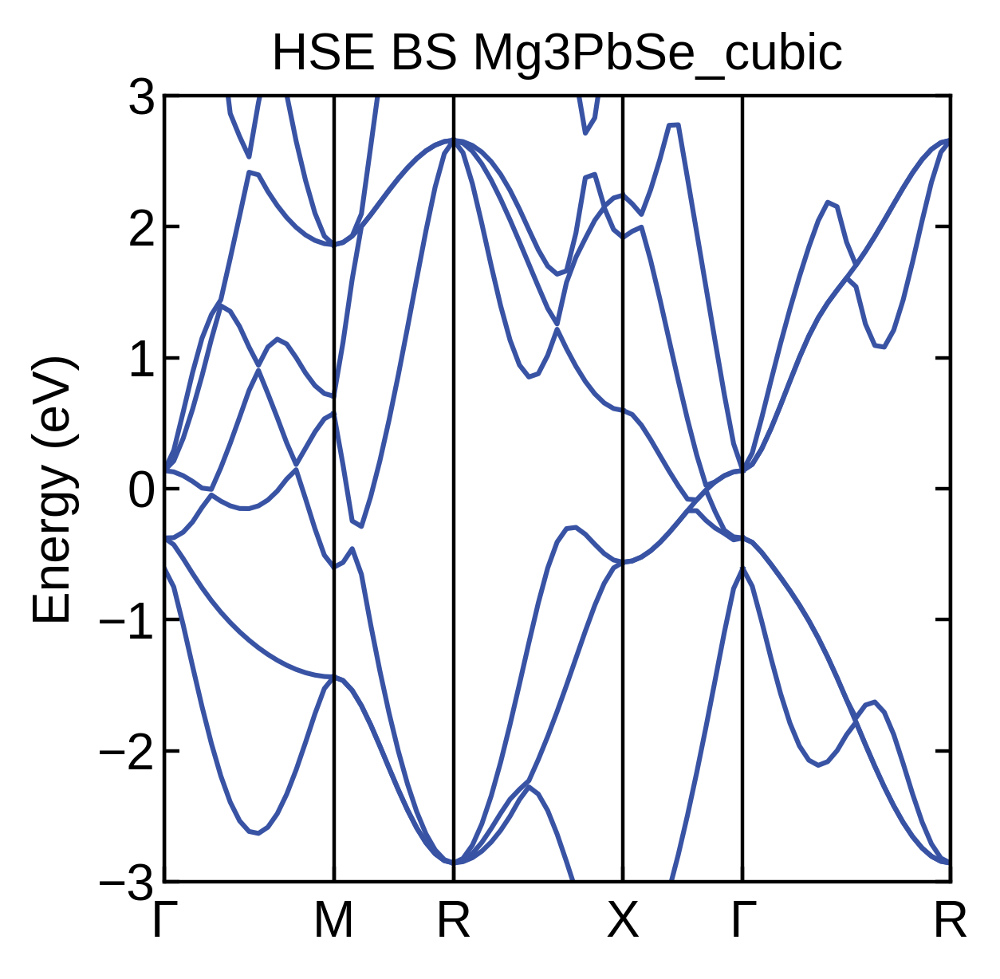

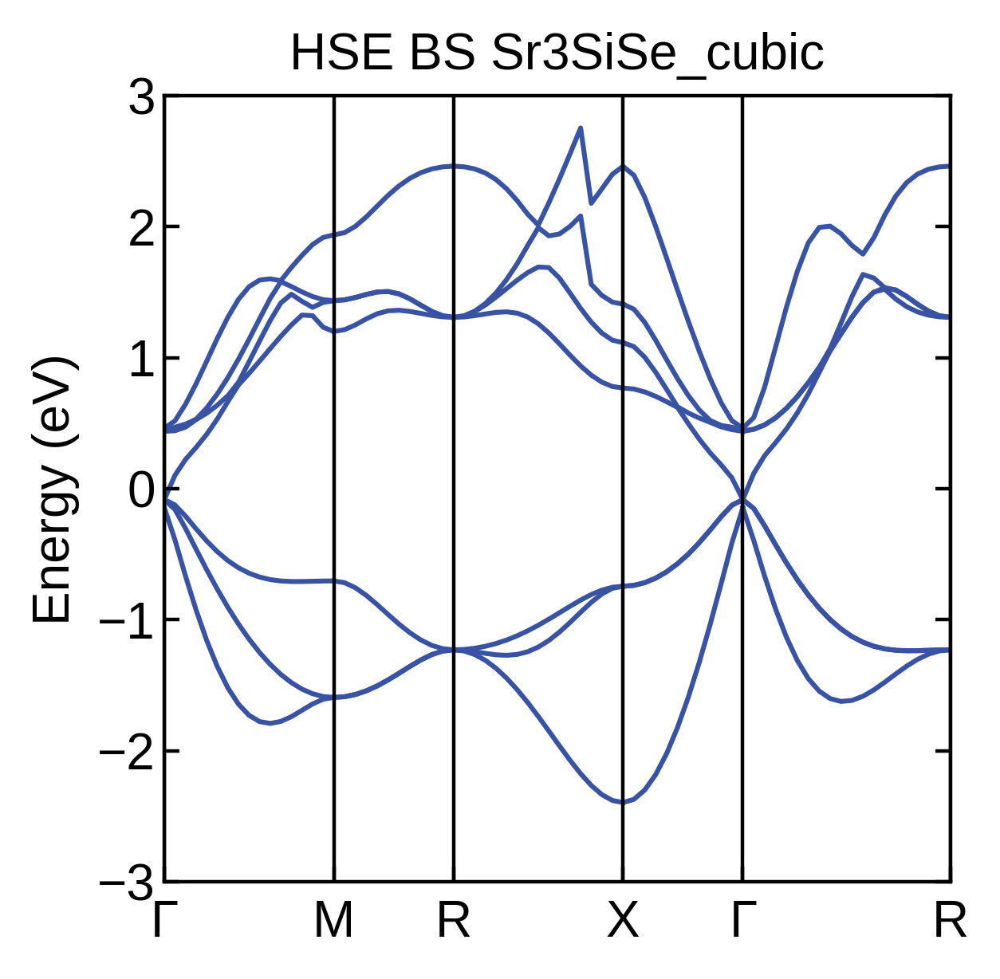

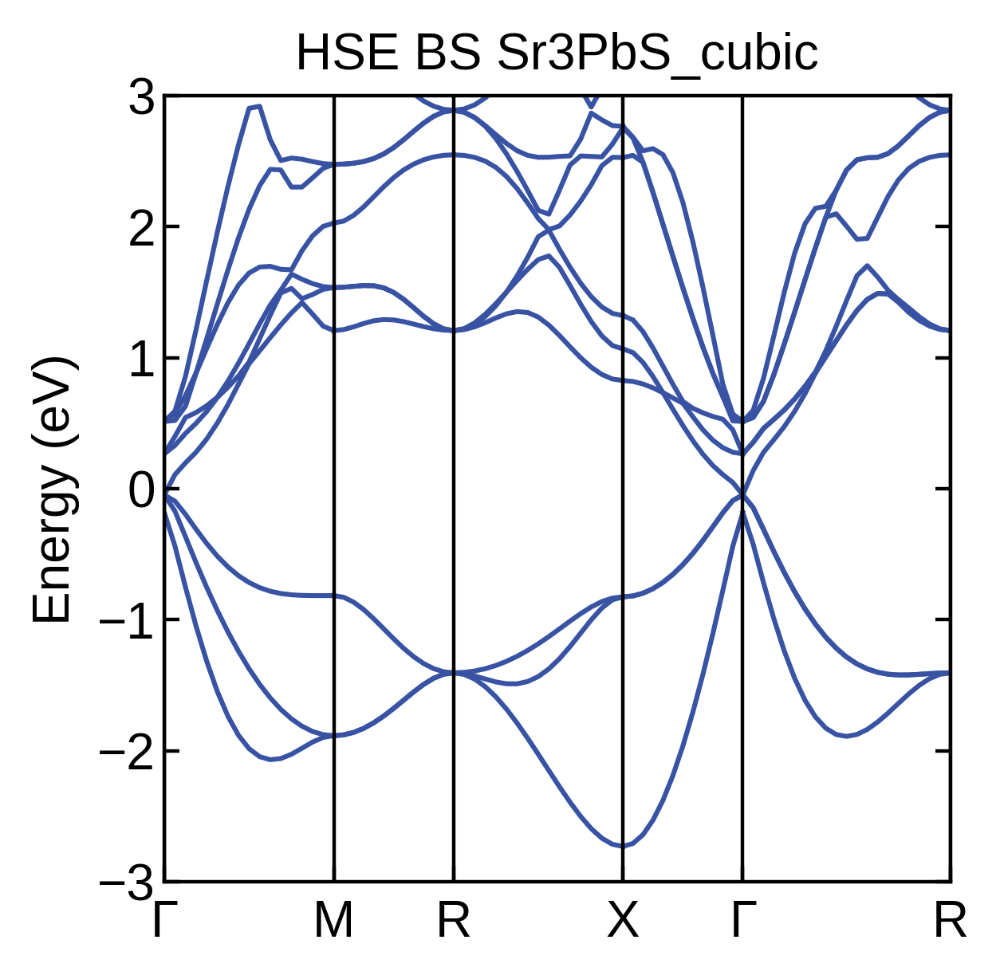

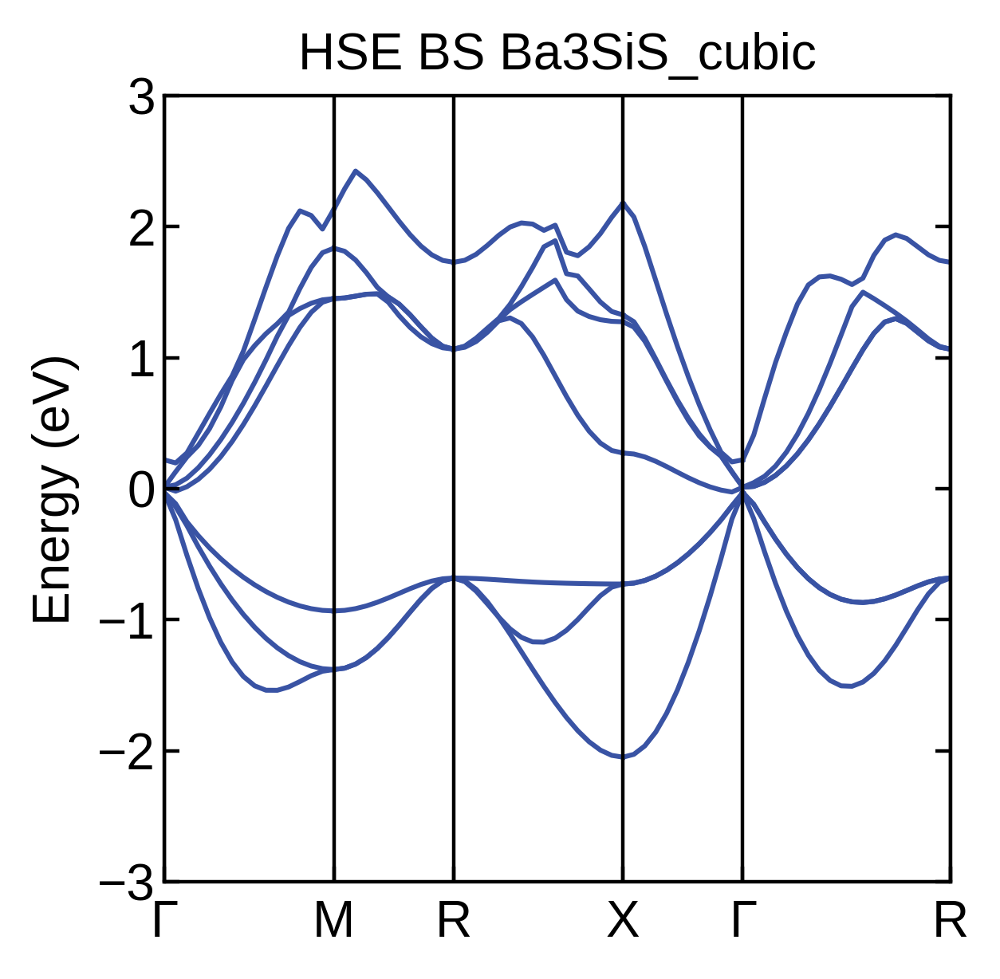

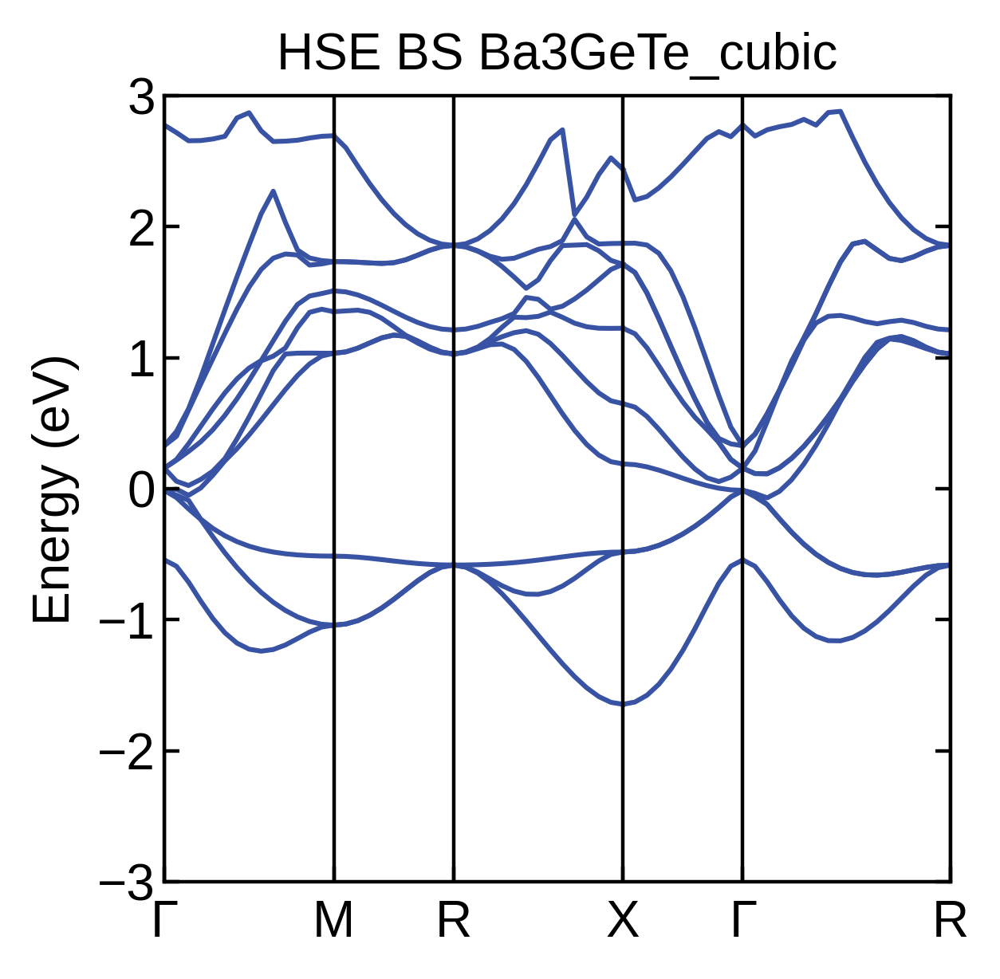

...

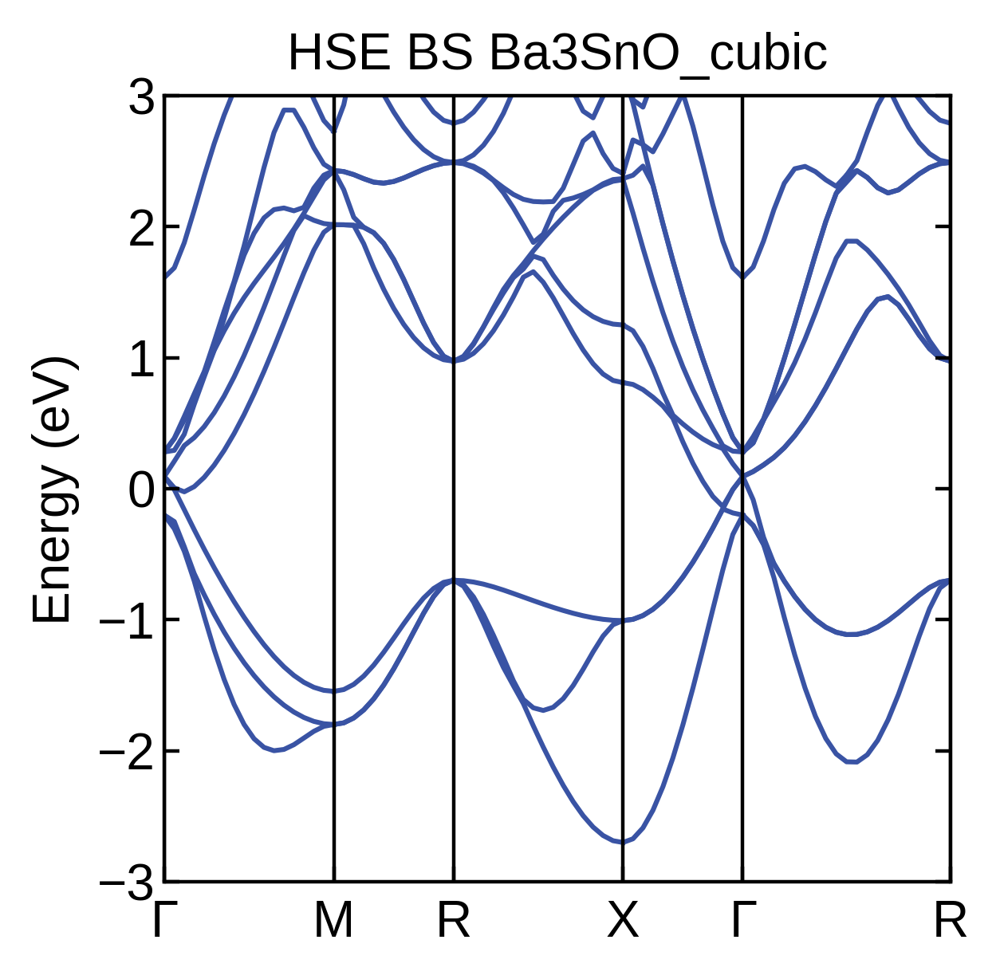

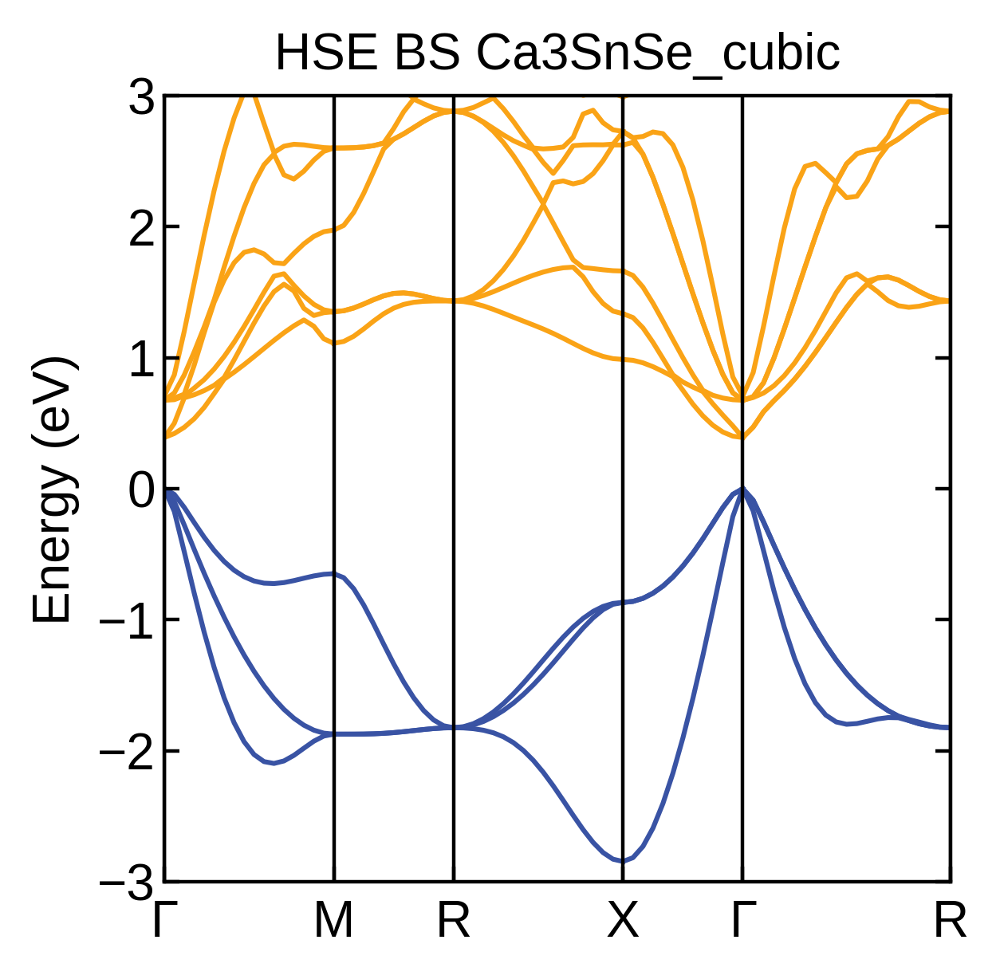

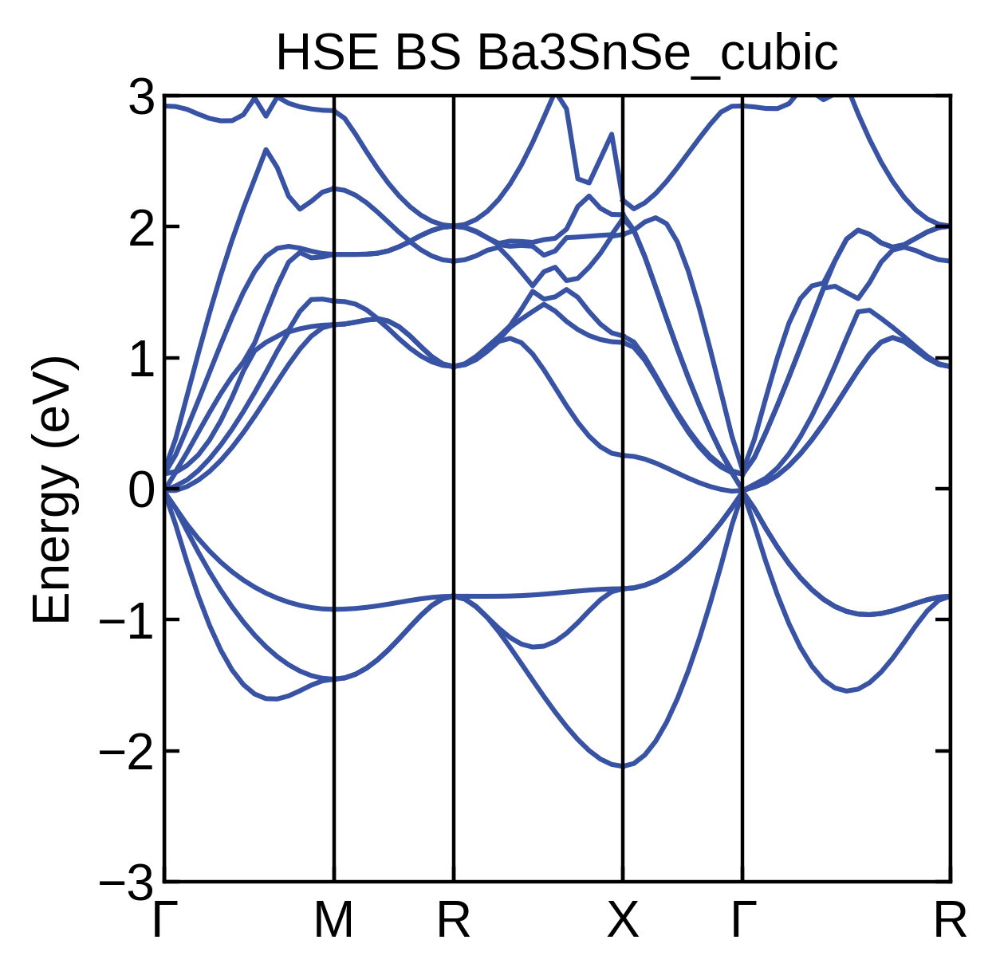

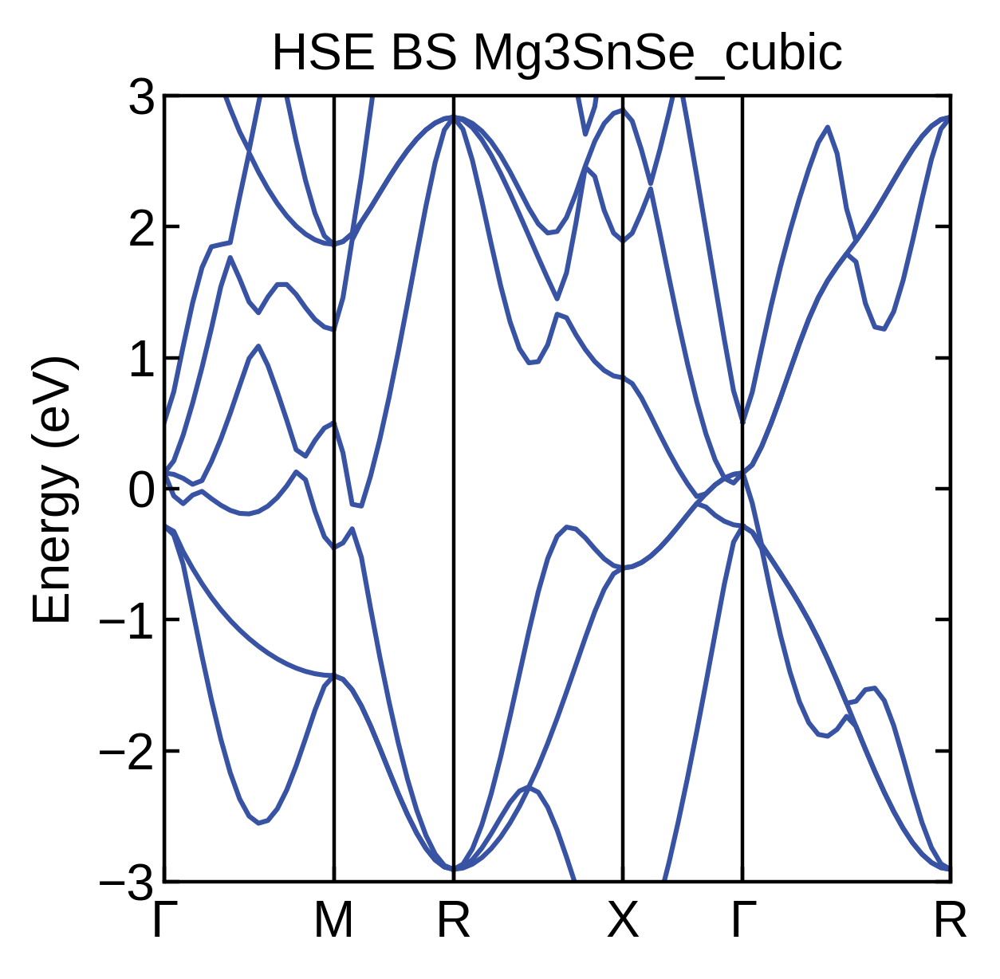

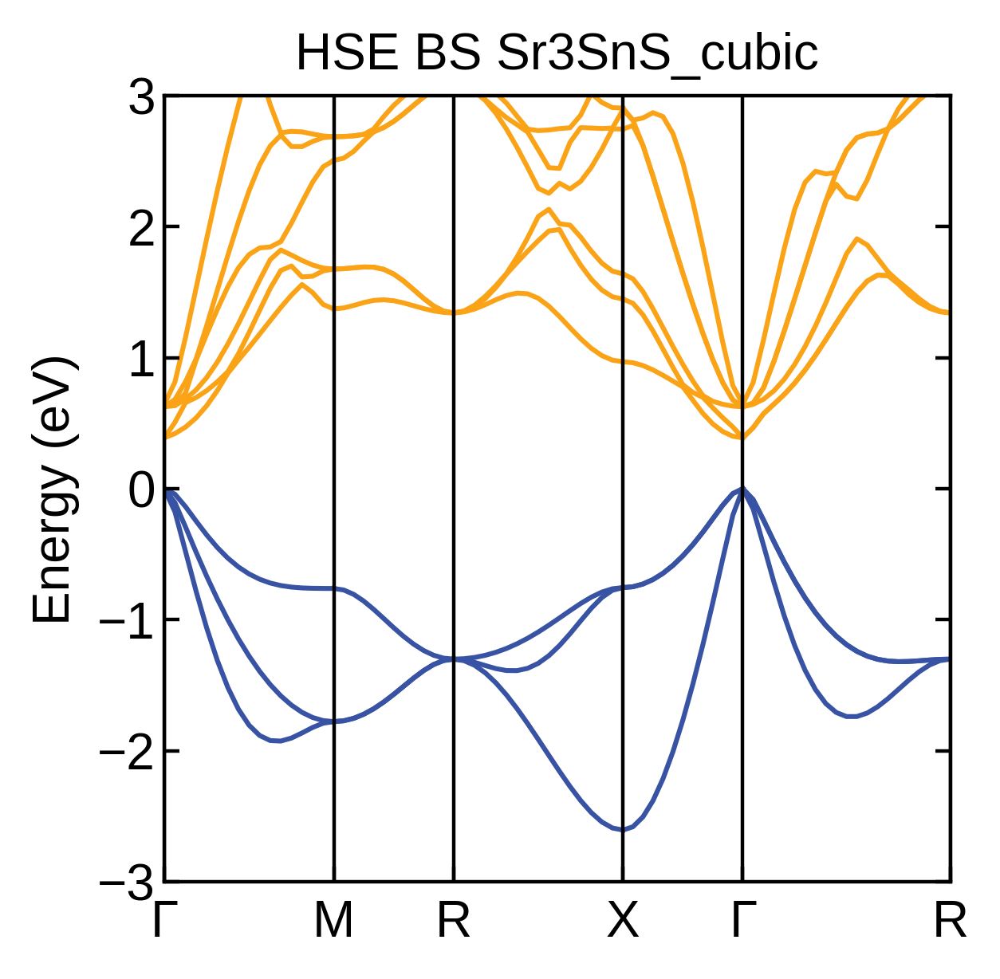

In [10]:
for key, value in results.items():
    fig = value.get_plot(ymin=-3, ymax=3)
    fig.gca().set_title(f'HSE BS {key}')
    fig.savefig(f'hse_bandstructures/{key}.pdf')